<a href="https://colab.research.google.com/github/jiyongkimkor/EOGS_gsplat/blob/main/gsplat.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [2]:
!pip install git+https://github.com/nerfstudio-project/gsplat.git
!pip install tyro
!pip install git+https://github.com/rahul-goel/fused-ssim/ --no-build-isolation
!pip install viser
!pip install piq

  Cloning https://github.com/nerfstudio-project/gsplat.git to /tmp/pip-req-build-wfap8_iv
  Running command git clone --filter=blob:none --quiet https://github.com/nerfstudio-project/gsplat.git /tmp/pip-req-build-wfap8_iv
  Resolved https://github.com/nerfstudio-project/gsplat.git to commit 450981757afac1c7a4a2887e8f9da2c13a9dc688
  Running command git submodule update --init --recursive -q
  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 55.4/55.4 kB 3.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 422.8/422.8 kB 19.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 1.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 82.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 72.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 47.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.0 MB/s eta 0:00:00
   ━━━━

In [3]:
!pip install plyfile

In [1]:
import math
import os
import time
from pathlib import Path
from typing import Literal, Optional

import numpy as np
import torch
from PIL import Image
from torch import Tensor, optim

import json
import math
import os
from collections import defaultdict
from dataclasses import dataclass, field
from pathlib import Path
from typing import Dict, List, Optional, Tuple, Union

import imageio
import numpy as np
import torch
import torch.nn.functional as F
import tqdm
import tyro
import viser
from fused_ssim import fused_ssim
import matplotlib.pyplot as plt


In [2]:
def decompose(R, ic, jc):
    i_coord = R[0, :3] / np.linalg.norm(R[0, :3])

    j_coord = R[1, :3]
    j_coord = j_coord - np.dot(j_coord, i_coord) * i_coord
    j_coord = j_coord / np.linalg.norm(j_coord)

    h_coord = np.cross(i_coord, j_coord)
    h_coord /= np.linalg.norm(h_coord)

    V = np.eye(4)
    V[0, :3] = i_coord ; V[1, :3] = j_coord ; V[2, :3] = h_coord

    intrinsics = R[:3,:3] @ np.linalg.inv(V[:3,:3])

    intrinsics[0,2] += ic
    intrinsics[1,2] += jc
    intrinsics[2,2] = 1

    K_inv = np.linalg.inv(intrinsics)
    Rt = K_inv @ R[:3, :]  # This gives [R | t]

    t_est = Rt[:, 3].reshape(3, 1)
    extrinsic = np.hstack((V[:3, :3], t_est))
    V[:3, :4] = extrinsic
    #print("calculated V:\n", V, "\ncalculated intrinsics:\n", intrinsics)
    return V, intrinsics

In [3]:
def decompose(R, ic, jc):
    # Ensure R is a 3x4 matrix
    assert R.shape == (3, 4), "Input matrix must be 3x4"

    # Split into rotation (3x3) and translation (3x1) parts
    M = R[:, :3]
    t = R[:, 3]

    # RQ decomposition to get intrinsic matrix K and rotation matrix R_
    K, _ = rq(M)

    K[0,2] += ic ; K[1,2] += jc
    K[2,2] = 1

    V = np.eye(4)
    V[:3, :3] = np.linalg.inv(K) @ R[:3, :3]
    V[:3, 3] = np.linalg.inv(K) @ R[:3, 3]
    # Make sure the diagonal of K is positive
    # Camera center in world coordinates
    #print(V, '\n', K)
    return V, K

In [4]:
import os
import torch
from torch.utils.data import Dataset
from PIL import Image
import torchvision.transforms as transforms
import imageio
import os
import numpy as np

torch.cuda.empty_cache()
directory = '/content/drive/MyDrive/msplat/dfc2019/track3/'
directory_path = os.path.join(directory, 'data', 'Track3-Truth')
os.chdir(os.path.join(directory, 'mvs'))

from rpc import RPC
from utm import utm_to_wgs84

root_dir = '/content/drive/MyDrive/msplat/dataset/'

import re
from collections import defaultdict
from scipy.linalg import rq
from numpy.linalg import inv
import cv2
import json

class JAX(Dataset):
    def __init__(self, root_dir, scene_num, square = 1024):
        self.scene_num = scene_num
        meta_root = os.path.join(root_dir, 'root_dir', 'crops_rpcs_ba_v2', "JAX_" + scene_num)
        img_root = os.path.join(root_dir, 'DFC2019', 'Track3-RGB-crops', "JAX_" + scene_num)
        dsm_root = os.path.join(root_dir, 'DFC2019', 'Track3-Truth')
        # --------------------------------------------------------------------------------
        files = sorted(os.listdir(img_root))
        files = sorted([f for f in os.listdir(img_root) if f.lower().endswith('.tif')])

        metas = [i[:-4] + '.json' for i in files]
        print(f"initialized images: {len(files)} {files}")
        self.projection_cache = []
        # ---------------------------------------------------------------------------------
        dsm_dir = os.path.join(dsm_root, f'JAX_{self.scene_num}_DSM.tif')
        bounds_file = os.path.join(dsm_root, f'JAX_{scene_num}_DSM.txt')
        easting, northing, pixels, gsd = np.loadtxt(bounds_file)
        self.easting = easting
        self.northing = northing
        self.pixels = pixels
        self.gsd = gsd
        utm_x = easting + (pixels // 2) * gsd
        utm_y = northing + (pixels // 2) * gsd
        wlat, wlon = utm_to_wgs84(utm_x, utm_y, 17, zone_letter='Q', northern=None, strict=True)

        self.dsm = imageio.imread(dsm_dir).astype(np.float32)
        # ----------------------------------------------------------------------------------
        # change center height 0
        # image center, image center, height -> ic, jc

        self.height = 0
        self.dsm = self.dsm - self.height

        for i in range(len(files)):
            img_dir = os.path.join(img_root, files[i])
            meta_dir = os.path.join(meta_root, metas[i])
            with open(meta_dir, "r") as meta:
                meta_json = json.load(meta)
            rpc_data = meta_json['rpc']

            meta = RPC(img_dir)
            meta.lon_off = float(rpc_data['lon_offset'])
            meta.lon_scale = float(rpc_data['lon_scale'])
            meta.lat_off = float(rpc_data['lat_offset'])
            meta.lat_scale = float(rpc_data['lat_scale'])
            meta.height_off = float(rpc_data['alt_offset'])
            meta.height_scale = float(rpc_data['alt_scale'])
            meta.line_off = float(rpc_data['row_offset'])
            meta.line_scale = float(rpc_data['row_scale'])
            meta.samp_off = float(rpc_data['col_offset'])
            meta.samp_scale = float(rpc_data['col_scale'])

            meta.line_num_coeff = np.asarray(rpc_data['row_num'], dtype=np.float64)
            meta.line_den_coeff = np.asarray(rpc_data['row_den'], dtype=np.float64)
            meta.samp_num_coeff = np.asarray(rpc_data['col_num'], dtype=np.float64)
            meta.samp_den_coeff = np.asarray(rpc_data['col_den'], dtype=np.float64)
            # ---------------------------------------------------------------------------------------
            R, rms, ic, jc, Loc =  meta.to_matrix(wlat, wlon, self.height)

            ic_scale = ic / 128
            jc_scale = jc / 128
            print(ic_scale, jc_scale)

            R[0,3] += ic
            R[1,3] += jc
            img = imageio.imread(img_dir)
            img = img.astype(np.float32) / 255.0

            V, intrinsics = decompose(R, ic, jc)
            #print("decomposition done")
            # --------------------------------------------------------------------------------
            # moves (ic,jc,0) -> (0,0,0)
            Loc = np.array([[R[0,0], R[0,1], R[0,2], R[0,3]],
                            [R[1,0], R[1,1], R[1,2], R[1,3]],
                            [0, 0, 1.0, 0],
                            [0, 0, 0, 1.0]])
            Loc = inv(Loc)
            # --------------------------------------------------------------------------------
            el = meta_json['sun_elevation']
            az = meta_json['sun_azimuth']
            azimuth_rad = np.radians(float(az))
            elevation_rad = np.radians(float(el))
            sun_x = np.cos(elevation_rad) * np.sin(azimuth_rad)
            sun_y = np.cos(elevation_rad) * np.cos(azimuth_rad)
            sun_z = np.sin(elevation_rad)
            d = np.array([sun_x/sun_z, sun_y/sun_z, 1])
            e = np.array([0, 0, 1])
            e_dot_d = np.dot(e, d)
            d_outer_e = np.outer(d, e)
            transformation_matrix = np.eye(3) - (d_outer_e / e_dot_d)
            S = np.zeros((3,4))

            S[:3, :3] = R[:3, :3 ] @ transformation_matrix
            S[:3, 3] = R[:3, 3]

            #V_S, intrinsics_S = decompose(S, ic, jc)

            K_inv = np.linalg.inv(intrinsics)

            V_S = np.eye(4)
            V_S[:3, :3] = K_inv @ S[:3, :3]
            V_S[:3, 3] = K_inv @ S[:3, 3]

            #V_S[2,3] = 1.0
            #V[2,3] = 1.0
            #print(intrinsics, '\n', intrinsics_S)

            #V[2, 2:] = [-1,2000]
            #V_S[2, 2:] = [-1,2000]

            #print(V, '\n', abs(np.linalg.det(V[:2,:2])), '\n', V_S, '\n',  abs(np.linalg.det(V_S[:2,:2])))
            #R[0,3] -= ic ; R[1,3] -= jc ;
            #S[0,3] -= ic - 768 ; S[1,3] -= jc - 768
            R = np.vstack([R, [0, 0, 0, 1]]) ; S = np.vstack([S, [0, 0, 0, 1]])

            #z_R = np.cross(R[0, :3], R[1, :3])
            #z_S = np.cross(S[0, :3], S[1, :3])

            # Normalize the cross product to make it a unit vector (optional depending on usage)
            #z_R = z_R / np.linalg.norm(z_R + 1e-8)
            #z_S = z_S / np.linalg.norm(z_S + 1e-8)
            '''
            R[2, :3] = z_R ; R[2, 3] = 2000
            S[2, :3] = z_S ; S[2, 3] = 2000
            '''
            R[2, :] = [0, 0, -1, 200] ; S[2, :] = [0, 0, -1, 200]
            R[0, :] = R[0, :] / ic_scale ; S[0, :] = S[0, :] / ic_scale
            R[1, :] = R[1, :] / jc_scale ; S[1, :] = S[1, :] / jc_scale

            print(R, '\n', abs(np.linalg.det(R[:2,:2])), '\n', S, '\n',  abs(np.linalg.det(S[:2,:2])))

            #'''
            intrinsics = torch.tensor([
                [ic_scale, 0, 0],
                [0, jc_scale, 0],
                [0, 0, 1]
            ], dtype=torch.float32, device=device).unsqueeze(0)

            #'''
            # --------------------------------------------------------------------------------
            img = torch.from_numpy(img).cuda().to(torch.float32)
            R = torch.from_numpy(R).cuda().to(torch.float32)
            V = torch.from_numpy(V).cuda().to(torch.float32)
            S = torch.from_numpy(S).cuda().to(torch.float32)
            Loc = torch.from_numpy(Loc).cuda().to(torch.float32)
            #intrinsics = torch.from_numpy(intrinsics).cuda().to(torch.float32)
            V_S = torch.from_numpy(V_S).cuda().to(torch.float32)

            self.projection_cache.append((img, R, intrinsics, V, Loc, S, V_S, ic, jc, meta_json['height'], meta_json['width'], meta_json))

    def __len__(self):
        return len(self.projection_cache)

    def __getitem__(self, idx):
        img, R, intrinsics, V, Loc, S, V_S, ic, jc, height, width, meta_json = self.projection_cache[idx]
        return img, R, intrinsics, V, Loc, S, V_S, ic, jc, height, width, meta_json

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

In [5]:

import torch
from torch.utils.data import DataLoader
import os
from tqdm.auto import tqdm
import torch.nn as nn

root_dir = '/content/drive/MyDrive/msplat/dataset/'
scene_num = '068'
batch_size = 1
square = 1024

jax_dataset = JAX(root_dir=root_dir, scene_num=scene_num, square = square)
jax_loader = DataLoader(dataset=jax_dataset, batch_size=batch_size, shuffle=False)
seed = 123
torch.manual_seed(seed)


initialized images: 19 ['JAX_068_001_RGB.tif', 'JAX_068_002_RGB.tif', 'JAX_068_003_RGB.tif', 'JAX_068_004_RGB.tif', 'JAX_068_005_RGB.tif', 'JAX_068_006_RGB.tif', 'JAX_068_007_RGB.tif', 'JAX_068_009_RGB.tif', 'JAX_068_010_RGB.tif', 'JAX_068_011_RGB.tif', 'JAX_068_012_RGB.tif', 'JAX_068_013_RGB.tif', 'JAX_068_014_RGB.tif', 'JAX_068_015_RGB.tif', 'JAX_068_016_RGB.tif', 'JAX_068_018_RGB.tif', 'JAX_068_019_RGB.tif', 'JAX_068_020_RGB.tif', 'JAX_068_022_RGB.tif']


/tmp/ipython-input-4-1359597032.py:52: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  self.dsm = imageio.imread(dsm_dir).astype(np.float32)
/usr/local/lib/python3.11/dist-packages/osgeo/gdal.py:312: FutureWarning: Neither gdal.UseExceptions() nor gdal.DontUseExceptions() has been explicitly called. In GDAL 4.0, exceptions will be enabled by default.
  warnings.warn(


XYZIJ Centers:  436206.991941076 3357623.9998463066 0 365.5299163077845 398.48302585579006
2.8557024711545664 3.11314863949836
[[ 1.84711401e-03  1.01835703e+00 -3.45696351e-01  1.30160324e+02]
 [ 9.76254491e-01 -4.59058636e-02 -1.13670931e-01  1.30350635e+02]
 [ 0.00000000e+00  0.00000000e+00 -1.00000000e+00  2.00000000e+02]
 [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  1.00000000e+00]] 
 0.9942604165400135 
 [[ 1.84711401e-03  1.01835703e+00  7.20697011e-01  1.30160324e+02]
 [ 9.76254491e-01 -4.59058636e-02 -4.27012481e-01  1.30350635e+02]
 [ 0.00000000e+00  0.00000000e+00 -1.00000000e+00  2.00000000e+02]
 [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  1.00000000e+00]] 
 0.9942604165400135


/tmp/ipython-input-4-1359597032.py:92: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  img = imageio.imread(img_dir)


XYZIJ Centers:  436206.991941076 3357623.9998463066 0 391.1064316409818 405.5099872185946
3.05551899719517 3.16804677514527
[[ 3.36051526e-03  1.01787652e+00 -2.09441851e-01  1.30158314e+02]
 [ 9.94935768e-01 -2.70947934e-02 -9.62702962e-02  1.30431128e+02]
 [ 0.00000000e+00  0.00000000e+00 -1.00000000e+00  2.00000000e+02]
 [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  1.00000000e+00]] 
 1.012812807608592 
 [[ 3.36051526e-03  1.01787652e+00  7.17183928e-01  1.30158314e+02]
 [ 9.94935768e-01 -2.70947934e-02 -4.19735927e-01  1.30431128e+02]
 [ 0.00000000e+00  0.00000000e+00 -1.00000000e+00  2.00000000e+02]
 [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  1.00000000e+00]] 
 1.012812807608592
XYZIJ Centers:  436206.991941076 3357623.9998463066 0 375.60872227310205 412.13051575019966
2.9344431427586097 3.219769654298435
[[ 1.02167538e+00 -5.13427248e-03 -2.44345937e-01  1.30543365e+02]
 [-5.87425712e-02 -9.28138629e-01 -2.27301950e-01  1.25915266e+02]
 [ 0.00000000e+00  0.00000000e+00

In [6]:
for i in range(len(jax_loader)):
  img, R, intrinsics, V, Loc, S, V_S, ic, jc, height, width, meta_json = jax_dataset.__getitem__(0)
  print(meta_json['max_alt'], meta_json['min_alt'])

30 -27
30 -27
30 -27
30 -27
30 -27
30 -27
30 -27
30 -27
30 -27
30 -27
30 -27
30 -27
30 -27
30 -27
30 -27
30 -27
30 -27
30 -27
30 -27


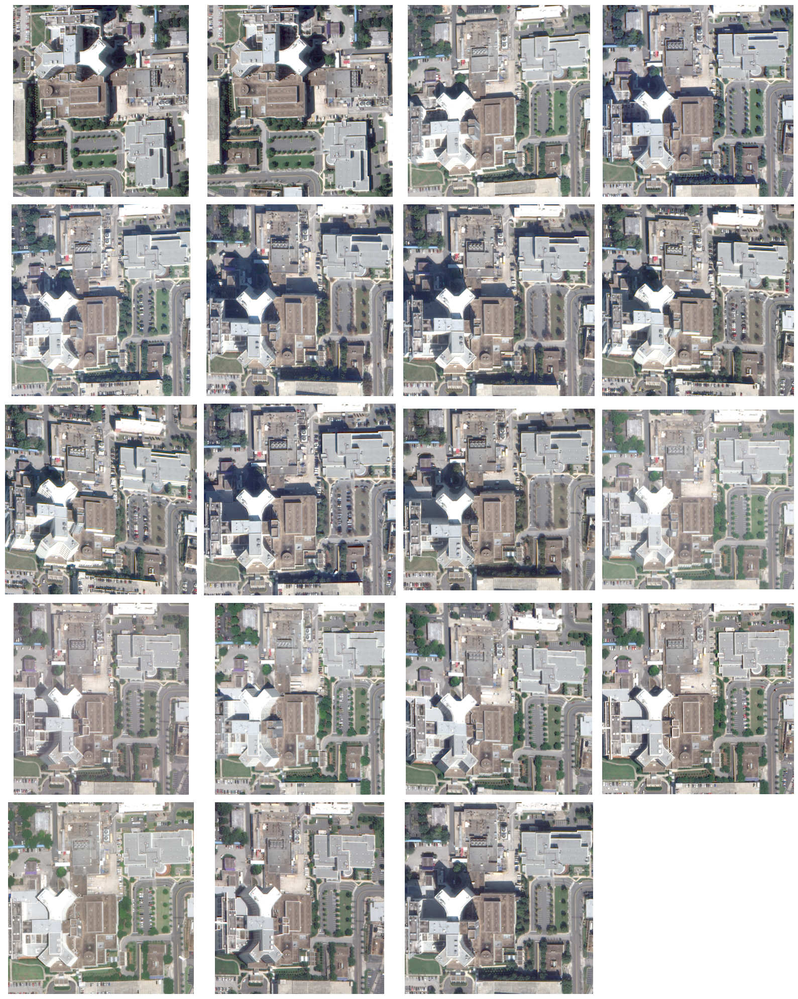

In [7]:
import matplotlib.pyplot as plt
import numpy as np
import torch

# Function to convert tensor image to numpy format
def tensor_to_numpy(img_tensor):
    if img_tensor.shape[0] == 1:  # Grayscale
        return img_tensor.squeeze().numpy()
    else:  # RGB
        return img_tensor.numpy()

# Gather all images from the DataLoader
all_images = []
for batch in jax_loader:
    images = batch[0] if isinstance(batch, (list, tuple)) else batch  # Handle (image, label) case
    all_images.extend(images)

# Number of images
num_images = len(all_images)
cols = 4  # Adjust this based on desired layout
rows = (num_images + cols - 1) // cols

# Plotting
fig, axes = plt.subplots(rows, cols, figsize=(4 * cols, 4 * rows))
axes = axes.flatten()

for i in range(len(axes)):
    axes[i].axis('off')
    if i < num_images:
        img_np = tensor_to_numpy(all_images[i].cpu())
        axes[i].imshow(img_np)

plt.tight_layout()
plt.show()


In [8]:
import torch.nn.functional as F
import torch.nn as nn
import piq
def heightdiff(rendered_height_img,           # Rendered height
               rendered_height_sun, intrinsics,           # Rendered height sun
               Loc, S, img_w, img_h, ic, jc, device,   # Localization function (2D, height -> 3D)
               ):

    xx, yy = torch.meshgrid(torch.arange(img_w), torch.arange(img_h), indexing='xy')
    xx = xx.to(device).reshape(-1)
    yy = yy.to(device).reshape(-1)

    height_flat = rendered_height_img.view(-1)
    pts_img = torch.stack([xx + 0.5, yy + 0.5, height_flat, torch.ones_like(height_flat)], dim=0).to(device)
    xyz_world = Loc @ pts_img  # (4, N)

    uv_sun = S @ xyz_world  # (3, N)
    uv_sun[0] = uv_sun[0] * intrinsics[0,0] + intrinsics[0,2]
    uv_sun[1] = uv_sun[1] * intrinsics[1,1] + intrinsics[1,2]

    if intrinsics[0,2] == 768:
        uv_sun_norm = torch.stack([
            (uv_sun[0] / (1536 - 1)) * 2 - 1,
            (uv_sun[1] / (1536 - 1)) * 2 - 1
        ], dim=-1)  # (N, 2)

    else:
        uv_sun_norm = torch.stack([
            (uv_sun[0] / (1536 - 1)) * 2 - 1,
            (uv_sun[1] / (1536 - 1)) * 2 - 1
        ], dim=-1)  # (N, 2)

    uv_mask = (uv_sun_norm.abs() < 1).all(dim=-1)  # (N,), True if both u and v in (-1, 1)
    uv_sun_grid = uv_sun_norm.view(img_h, img_w, 2).unsqueeze(0)  # For grid_sample

    if rendered_height_sun.ndim == 3:
        rendered_height_sun = rendered_height_sun.squeeze(-1)  # (H, W)
    rendered_height_sun = rendered_height_sun.unsqueeze(0).unsqueeze(0)

    z_after = F.grid_sample(rendered_height_sun, uv_sun_grid, mode='bilinear', align_corners=True, padding_mode='zeros').squeeze()
    z_before = xyz_world[2, :].view(img_h, img_w)

    mask = (z_after != 0.0)
    combined_mask = mask & uv_mask.view(img_h, img_w)

    return z_after, z_before, combined_mask


def renderdiff(rendered_feature,
               rendered_feature_B,
               rendered_height_img, intrinsics,            # Rendered height
               Loc, B, img_w, img_h, ic, jc, device,   # Localization function (2D, height -> 3D)
               ):

    rendered_feature = rendered_feature.permute(2, 0, 1).contiguous()  # [3, H, W]

    xx, yy = torch.meshgrid(torch.arange(img_w), torch.arange(img_h), indexing='xy')
    xx = xx.to(device).reshape(-1)
    yy = yy.to(device).reshape(-1)

    height_flat = rendered_height_img.view(-1)

    pts_img = torch.stack([xx + 0.5, yy + 0.5, height_flat, torch.ones_like(height_flat)], dim=0).to(device)
    xyz_world = Loc @ pts_img  # (4, N)

    uv_B = B @ xyz_world  # (3, N)
    uv_B[0] = uv_B[0] * intrinsics[0,0] + intrinsics[0,2]
    uv_B[1] = uv_B[1] * intrinsics[1,1] + intrinsics[1,2]

    if intrinsics[0,2] == 768:
        uv_B_norm = torch.stack([
            (uv_B[0] / (1536 - 1)) * 2 - 1,
            (uv_B[1] / (1536 - 1)) * 2 - 1
        ], dim=-1)  # (N, 2)

    else:
        uv_B_norm = torch.stack([
            (uv_B[0] / (1536 - 1)) * 2 - 1,
            (uv_B[1] / (1536 - 1)) * 2 - 1
        ], dim=-1)  # (N, 2)
    uv_B_grid = uv_B_norm.view(img_h, img_w, 2).unsqueeze(0)  # [1, H, W, 2]

    if rendered_feature_B.ndim == 3:
        rendered_feature_B = rendered_feature_B.permute(2, 0, 1).unsqueeze(0)  # [1, 3, H, W]

    z_after = F.grid_sample(rendered_feature_B, uv_B_grid, mode='bilinear', align_corners=True, padding_mode='zeros').squeeze(0)
    z_before = rendered_feature

    return z_after, z_before

def shadow_term(after_before_diff,
                density = 5,
                ambient = 0.01
                ):

    shadow_term = torch.clamp(torch.exp(-density * after_before_diff), 0.05, 0.95).float()
    coeff = shadow_term + (1 - shadow_term) * ambient  # (B, H, W)
    return coeff, shadow_term

def binary_entropy(p):
    eps = 0.05
    return - (p * torch.log2(torch.clamp(p, eps, 1 - eps)) + (1 - p) * torch.log2(1 - torch.clamp(p, eps, 1 - eps)))

# EOGS Runner

In [12]:
from tifffile import imwrite
from tqdm import tqdm
from IPython.display import clear_output
from gsplat import rasterization
from plyfile import PlyData, PlyElement

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

class SimpleTrainer:
    """Trains random gaussians to fit an image."""

    def __init__(
        self,
        num_points
    ):
        self.device = torch.device("cuda:0")
        self._init_gaussians()
        self.iter = 0
        self.num_points = num_points
    def _init_gaussians(self):
        """Random gaussians"""
        target_density = 0.15  # gaussians per true m³
        bd = 256 * 1.1
        self.max_z = 30.0 # 95
        self.min_z = -27.0 # -37

        self.a = - self.min_z * 1.3
        self.b = (self.max_z - self.min_z) * 1.3

        num_cameras = len(jax_dataset)
        volume_outer = bd * bd * (self.max_z - self.min_z) * (1.1**3)

        num_pts_to_be_generated = int(target_density * volume_outer)
        self.num_points = num_pts_to_be_generated
        print(f"Target density: {target_density}, total points to sample: {num_pts_to_be_generated}")

        xyz = torch.rand((num_pts_to_be_generated, 3), device=self.device)
        xyz[:, 0] = (xyz[:, 0] - 0.5) * bd * 1.1  # X in [-bd/2, bd/2]
        xyz[:, 1] = (xyz[:, 1] - 0.5) * bd * 1.1  # Y in [-bd/2, bd/2]
        xyz[:, 2] = (xyz[:, 2]) * (self.max_z - self.min_z) * 1.1 + self.min_z * 1.1  # Z in [min_z, max_z]

        if num_pts_to_be_generated > self.num_points:
            idx = torch.randperm(num_pts_to_be_generated)[:self.num_points]
            xyz = xyz[idx]

        self.means = xyz
        self.rgbs = torch.ones(self.num_points, 3, device=self.device)

        s_init = (volume_outer / self.num_points) ** (1/3)
        print("initialized scale:", s_init)
        print("initialized density:",  self.num_points / (volume_outer))
        self.scales = torch.ones(self.num_points, 3, device=self.device) * math.log(s_init)

        u = torch.rand(self.num_points, 1, device=self.device)
        v = torch.rand(self.num_points, 1, device=self.device)
        w = torch.rand(self.num_points, 1, device=self.device)

        self.quats = torch.cat(
            [
                torch.sqrt(1.0 - u) * torch.sin(2.0 * math.pi * v),
                torch.sqrt(1.0 - u) * torch.cos(2.0 * math.pi * v),
                torch.sqrt(u) * torch.sin(2.0 * math.pi * w),
                torch.sqrt(u) * torch.cos(2.0 * math.pi * w),
            ],
            -1,
        )
        self.opacities = torch.ones((self.num_points), device=self.device) * -4.5
        self.mask = (torch.sigmoid(self.opacities) > 0.0025)
        # ---------------------------------------------------------------------------------------------
        # per camera
        self.color_corrections = nn.ModuleList([
            nn.Conv2d(3, 3, 1, bias=True).to(device) for _ in range(num_cameras)
        ])
        for cc in self.color_corrections:
            with torch.no_grad():
                cc.weight.copy_(torch.eye(3).view(3, 3, 1, 1))  # Identity matrix: no channel mixing
                cc.bias.zero_()

        self.ambient = torch.full((num_cameras, 1), 0.5, dtype=torch.float32).to(device)
        # ------------------------------------------------------------------------
        # activate parameters
        self.means.requires_grad = True ; self.scales.requires_grad = True ; self.quats.requires_grad = True
        self.rgbs.requires_grad = True ; self.opacities.requires_grad = True ; self.ambient.requires_grad = True
        self.frames = [] ; self.frames2 = []

        self.base_lrs = {
            'rgbs': 2.5e-3,
            'means': 1.6e-4,
            'scales': 5e-3,
            'opacities': 25e-2,
            'quats': 1e-3,
        }
        self.optimizer1 = optim.Adam([
            {'params': self.rgbs, 'lr': self.base_lrs['rgbs'], 'name': 'rgbs'}, {'params': self.means, 'lr': self.base_lrs['means'], 'name': 'means'},
            {'params': self.scales, 'lr': self.base_lrs['scales'], 'name': 'scales'},
            {'params': self.opacities, 'lr': self.base_lrs['opacities'], 'name': 'opacities'},
            {'params': self.quats, 'lr': self.base_lrs['quats'], 'name': 'quats'},
        ])
        self.optimizer2 = optim.Adam([
            {'params': list(self.color_corrections.parameters()), 'lr': 0.01},
            {'params': self.ambient, 'lr': 0.01},
        ])



    def train(
        self,
        iterations: int = 5000,
        lr: float = 0.01,
        save_imgs: bool = False,
        density = 0.2,
        model_type = "3dgs",
    ):
        times = [0] * 2  # rasterization, backward

        if model_type == "3dgs":
            rasterize_fnc = rasterization
        elif model_type == "2dgs":
            rasterize_fnc = rasterization_2dgs

        dsm_intrinsics = torch.tensor([
            [2.0, 0, 0],
            [0, 2.0, 0],
            [0, 0, 1.0]
        ], dtype=torch.float32, device=device).unsqueeze(0)

        dsm_viewmats = torch.tensor([
            [1.0, 0, 0, 128],
            [0, -1.0, 0, 128],
            [0.0, 0.0, -1.0, 200.0],
            [0, 0, 0, 1.0]], dtype=torch.float32, device=device).unsqueeze(0)

        num_cameras = len(jax_dataset)
        base_I = torch.eye(3, device=self.device)

        for iter in tqdm(range(self.iter, iterations)):
            loss_total = 0 ; loss_img = 0
            loss_opacity = 0 ; loss_shadow = 0
            loss_ac = 0 ; loss_cc = 0
            loss_ac_S = 0 ; loss_cc_S = 0
            loss_TV_altitude = 0

            mse_offset = 0
            offset = 0
            start = time.time()

            idx = iter % num_cameras
            batch = jax_dataset[idx]
            # ---------------------------------------------------------------------------------
            # gets data from data_loader
            img, R, intrinsics, V, Loc, S, V_S, ic, jc, height, width, meta_json = batch
            img = img.unsqueeze(0) ; R = R.unsqueeze(0) ; V = V.unsqueeze(0)
            Loc = Loc.unsqueeze(0) ; S = S.unsqueeze(0) ; V_S = V_S.unsqueeze(0)
            # ---------------------------------------------------------------------------------
            # random gaussian parameters for perturbation
            q1, q2 = np.random.rand(2) * 2 - 1
            I = base_I.clone()
            I[:2,2] = I[:2,2] + torch.randn(2, device=self.device).clip(-1,1)

            B = R.clone()
            B[0, :3, :3] = B[0, :3, :3] @ I

            # ---------------------------------------------------------------------------------
            # renders: [B, N, 3]

            intrinsics_S = torch.tensor([
                [ic / 128, 0, 768 - ic],
                [0, jc / 128, 768 - jc],
                [0, 0, 1.0]
            ], dtype=torch.float32, device=device).unsqueeze(0)

            renders, alpha, _ = rasterize_fnc(
                self.means, self.quats / self.quats.norm(dim=-1, keepdim=True),
                torch.exp(self.scales), torch.sigmoid(self.opacities),
                torch.cat([self.rgbs, (self.means[:, -1:] + self.a)/self.b], dim = -1),
                R, intrinsics,
                width, height,
                near_plane=-1e+5, far_plane=1e+5,
                camera_model="ortho", packed=False,)

            renders_height = renders[:, :, :, -1:] * self.b - self.a
            renders = renders[:, :, :, :3]
            loss_as = torch.mean((alpha - 1) ** 2)
            # ---------------------------------------------------------------------------------
            renders_B, alpha_B, _ = rasterize_fnc(
                self.means, self.quats / self.quats.norm(dim=-1, keepdim=True),
                torch.exp(self.scales), torch.sigmoid(self.opacities),
                torch.cat([self.rgbs, (self.means[:, -1:] + self.a)/self.b], dim = -1),
                B, intrinsics_S,
                1536, 1536,
                near_plane=-1e+5, far_plane=1e+5,
                camera_model="ortho", packed=False,)

            renders_height_B = renders_B[:, :, :, -1:] * self.b - self.a
            renders_B = renders_B[:, :, :, :3]
            loss_as_B = torch.mean((alpha_B - 1) ** 2)
            # ---------------------------------------------------------------------------------
            renders_height_S, alpha_S, _ = rasterize_fnc(
                self.means, self.quats / self.quats.norm(dim=-1, keepdim=True),
                torch.exp(self.scales), torch.sigmoid(self.opacities),
                torch.cat([self.rgbs, (self.means[:, -1:] + self.a)/self.b], dim = -1),
                S, intrinsics_S,
                1536, 1536,
                near_plane=-1e+5, far_plane=1e+5,
                camera_model="ortho", packed=False,)

            renders_S = renders_height_S[:, :, :, :3]
            renders_height_S = renders_height_S[:, :, :, -1:] * self.b - self.a
            loss_as_S = torch.mean((alpha_S - 1) ** 2)
            # ----------------------------------------------------------------------------------
            coeff_after, coeff_before, mask = heightdiff(
                renders_height[0], renders_height_S[0], intrinsics_S[0],
                Loc[0], S[0], width, height, ic, jc, device)
            coeff_1 = coeff_after - coeff_before
            # ----------------------------------------------------------------------------------
            # build shadow mask
            coeff, shdtrm = shadow_term(coeff_1, density = density,
                                        #density = self.density,
                                        ambient = self.ambient[idx])
                                        #ambient = 0.7)
            loss_shadow += binary_entropy(shdtrm).mean()
            # -----------------------------------------------------------------------------------
            # Define altitude, color consistency
            z_after, z_before, mask_ac = heightdiff(
                renders_height[0], renders_height_B[0], intrinsics_S[0],
                Loc[0], B[0], width, height, ic, jc, device)
            diff_ac = z_after - z_before

            c_after, c_before = renderdiff(
                renders[0], renders_B[0], renders_height[0], intrinsics_S[0],
                Loc[0], B[0], width, height, ic, jc, device,)
            diff_cc = c_after - c_before

            diff_mask = (diff_ac > -0.3) & (diff_ac < 0.3)

            loss_ac += torch.abs(diff_ac[diff_mask & mask_ac]).mean()
            loss_cc += torch.abs(diff_cc[: ,diff_mask & mask_ac]).mean()
            # ------------------------------------------------------------------------------------
            # Concatenate with bias to form affine (3, 4)
            cc = self.color_corrections[idx]
            D, H, W, C = renders.shape
            renders_nchw = renders.permute(0, 3, 1, 2)
            renders_corrected = cc(renders_nchw)
            renders_transformed = renders_corrected.permute(0, 2, 3, 1)
            # ------------------------------------------------------------------------------------
            # calculate img_loss
            coeff = coeff.unsqueeze(0).unsqueeze(-1)  # [1, H, W, 1]
            mask = mask.view(1, H, W, 1)  # same as coeff

            # Replace values outside mask with 1
            coeff_masked = torch.where(mask, coeff, torch.ones_like(coeff))
            if iter < 1000:
                #result = renders[:, :, :, :3]
                result = renders_transformed[:,:,:,:3]
            else:
                result = renders_transformed[:, :, :, :3] * coeff_masked
            l1loss = F.l1_loss(result, img)
            ssimloss = 1.0 - fused_ssim(
                result.permute(0, 3, 1, 2), img.permute(0, 3, 1, 2), padding="valid"
            )

            loss_img += l1loss * 0.8 + ssimloss * 0.2
            # ------------------------------------------------------------------------------

            loss_opacity += torch.sigmoid(self.opacities).sum() / self.num_points # Calculate mean of opacity (N, 1)

            diff_h = renders_height[:, 1:, :, :] - renders_height[:, :-1, :, :]
            diff_w = renders_height[:, :, 1:, :] - renders_height[:, :, :-1, :]

            loss_TV_altitude = 0.5 * (diff_h.abs().mean() + diff_w.abs().mean())

            if iter < 1000:
                loss_total = loss_img + loss_opacity * 0.1
            else:
                loss_total = (loss_img + loss_opacity * 0.1 + loss_shadow * 0.01
                                + loss_cc * 0.1 + loss_ac * 0.01
                                + loss_as * 0.01 + loss_as_B * 0.01 + loss_as_S * 0.01
                                #+ loss_cc_S * 0.1 + loss_ac_S * 0.01
                                #+ loss_TV_altitude * 0.1
                             )
            with torch.no_grad():
                dsm, dsm_alphas, _ = rasterize_fnc(
                    self.means, self.quats / self.quats.norm(dim=-1, keepdim=True),
                    torch.exp(self.scales), torch.sigmoid(self.opacities),
                    #torch.sigmoid(self.means[:, -1:]),
                    (self.means[:, -1:] + self.a) / self.b,
                    dsm_viewmats, dsm_intrinsics,
                    512, 512,
                    near_plane=-1e+5, far_plane=1e+5,
                    camera_model="ortho", packed=False,)

            self.optimizer1.zero_grad() ; self.optimizer2.zero_grad()
            start = time.time()

            loss_total.backward()
            torch.cuda.synchronize()
            times[1] += time.time() - start
            self.optimizer1.step() ; self.optimizer2.step()

            self.iter = iter + 1

            if iter % 100 == 0:
                self.prune_pts(threshold = 0.0025)
            if idx == (num_cameras -1 ):
                with torch.no_grad():

                    self.albedo = renders.detach().cpu() ; self.renders = result.detach().cpu()
                    self.diff_ac = diff_ac.detach().cpu() ; self.diff_mask = diff_mask.detach().cpu()
                    self.dsm_alphas = dsm_alphas.detach().cpu() ; self.renders_S = renders_S.detach().cpu()

                    self.dsm = (torch.clamp(dsm, 0, 1) * self.b - self.a).detach().cpu()
                    self.renders_height_B = renders_height_B.detach().cpu()
                    self.coeff_after = coeff_after.detach().cpu() ; self.coeff_before = coeff_before.detach().cpu()
                    self.coeff = coeff_masked.detach().cpu() ; self.renders_height_S = renders_height_S.detach().cpu()
                    self.c_after = c_after.detach().cpu() ; self.z_after = z_after.detach().cpu()
                    self.diff_h = diff_h.detach().cpu() ; self.diff_w = diff_w.detach().cpu()
                    self.coeff_1 = coeff_1.detach().cpu()

                    pred_dsm = jax_dataset.dsm.astype(np.float32)  # predicted DSM
                    gt_dsm = self.dsm[0, :, :, -1].numpy().astype(np.float32)  # ground truth DSM

                    mae = np.mean(np.abs(pred_dsm - gt_dsm))

                    clear_output(wait=True)
                    print(
                        f"[Iter {self.iter:>5}/{iterations}]\n"
                        f"Loss: {loss_total:.6f}, MAE: {mae:.6f}, PTS: {self.mask.sum().item()}\n"
                        f"   img:    {loss_img:.6f} | "
                        f"opacity:{loss_opacity:.6f} | "
                        f"shadow:{loss_shadow:.6f} | \n"
                        f"   cc:     {loss_cc:.6f} | cc_S:    {loss_cc_S:.6f} | "
                        f"ac:     {loss_ac:.6f} | ac_S:    {loss_ac_S:.6f} | TV:    {loss_TV_altitude:.6f} |\n"
                        f"   ambient:{(self.ambient[:num_cameras]).mean().item():.6f} | "
                        f"scale: {torch.exp(self.scales).mean().item():.6f} | "
                        f"opacity:{torch.sigmoid(self.opacities).mean().item():.6f}"
                    )


            if save_imgs and idx == (num_cameras - 1):
                self.frames.append(((torch.clamp(self.dsm[0, :, :, -1] * 4 + 120, 0, 255).numpy()).astype(np.uint8)))
                self.frames2.append(((self.renders[0, :, :, :3]*254).numpy()).astype(np.uint8))

        print(f"Total(s):\nRasterization: {times[0]:.3f}, Backward: {times[1]:.3f}")
        print(f"Per step(s):\nRasterization: {times[0]/iterations:.5f}, Backward: {times[1]/iterations:.5f}")

    def prune_pts(self, threshold = 0.0025):
        self.mask = (torch.sigmoid(self.opacities) > threshold)

        self.opacities = self.opacities[self.mask].clone().detach().requires_grad_(True)
        self.rgbs = self.rgbs[self.mask, :].clone().detach().requires_grad_(True)
        self.means = self.means[self.mask, :].clone().detach().requires_grad_(True)
        self.scales = self.scales[self.mask, :].clone().detach().requires_grad_(True)
        self.quats = self.quats[self.mask, :].clone().detach().requires_grad_(True)

        self.optimizer1 = optim.Adam([
            {'params': self.rgbs, 'lr': get_lr(self.base_lrs['rgbs'], self.iter), 'name': 'rgbs'},
            {'params': self.means, 'lr': get_lr(self.base_lrs['means'], self.iter), 'name': 'means'},
            {'params': self.scales, 'lr': get_lr(self.base_lrs['scales'], self.iter), 'name': 'scales'},
            {'params': self.opacities, 'lr': get_lr(self.base_lrs['opacities'], self.iter), 'name': 'opacities'},
            {'params': self.quats, 'lr': get_lr(self.base_lrs['quats'], self.iter), 'name': 'quats'},
        ])

    def save_imgs(self):
        # save them as a gif with PIL
        self.frames_PIL = [Image.fromarray(frame) for frame in self.frames]
        self.frames2_PIL = [Image.fromarray(frame2) for frame2 in self.frames2]
        out_dir = os.path.join(os.getcwd(), "results")
        imwrite(f'{out_dir}/dsm.tif', self.dsm[0, :, :, -1].numpy())
        imwrite(f'{out_dir}/dsm_alpha.tif', (self.dsm)[0, :, :, -1].numpy())
        os.makedirs(out_dir, exist_ok=True)
        self.frames_PIL[0].save(
            f"{out_dir}/dsm.gif",
            save_all=True,
            append_images=self.frames_PIL[1:],
            optimize=False,
            duration=5,
            loop=0,
        )
        self.frames2_PIL[0].save(
            f"{out_dir}/img.gif",
            save_all=True,
            append_images=self.frames2_PIL[1:],
            optimize=False,
            duration=5,
            loop=0,
        )

def image_path_to_tensor(image_path: Path):
    import torchvision.transforms as transforms

    img = Image.open(image_path)

    transform = transforms.ToTensor()
    img_tensor = transform(img).permute(1, 2, 0)[..., :3]
    return img_tensor

def get_lr(initial_lr, iter, decay_rate = 1.0, decay_steps = 500):
    return float(initial_lr * (decay_rate ** (iter/ decay_steps)))




In [13]:
#trainer.load_models(filename = './results/checkpoint.pth')
trainer = SimpleTrainer(1000000)
trainer.train(
    iterations=5000,
    lr=0.01,
    save_imgs=True,
    model_type="3dgs",
)

100%|██████████| 5000/5000 [04:49<00:00, 17.29it/s]

[Iter  4997/5000]
Loss: 0.083837, MAE: 1.880420, PTS: 17767
   img:    0.075015 | opacity:0.011838 | shadow:0.409231 | 
   cc:     0.024739 | cc_S:    0.000000 | ac:     0.106961 | ac_S:    0.000000 | TV:    0.230642 |
   ambient:0.415480 | scale: 2.683524 | opacity:0.666395
Total(s):
Rasterization: 0.000, Backward: 146.220
Per step(s):
Rasterization: 0.00000, Backward: 0.02924


[-27.017082 -27.01152  -27.009346 ...  27.230726  27.231758  27.232502]
[-27.429306 -27.404896 -27.400257 ...  27.240715  27.242214  27.243225]
[-27.516827 -27.482857 -27.47432  ...  27.235203  27.239498  27.239677]
[-26.295788 -26.295786 -26.295784 ...  29.218746  29.218748  29.21875 ]


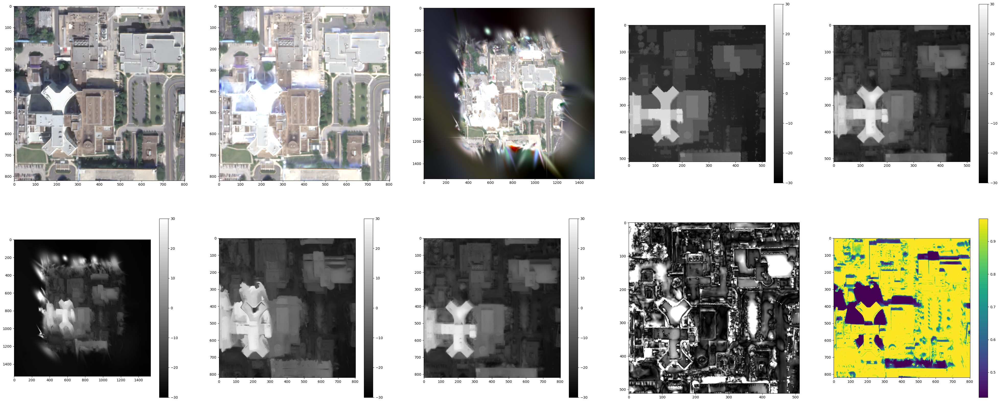

In [14]:
plt.figure(figsize=(50,20))
plt.subplot(2,5,1)
plt.imshow(trainer.renders.numpy()[0])
plt.subplot(2,5,2)
plt.imshow(trainer.albedo.numpy()[0])
plt.subplot(2,5,3)
plt.imshow(trainer.renders_S.numpy()[0])
plt.subplot(2,5,4)
im = plt.imshow(jax_dataset.dsm, cmap = 'gray', vmin = -30 - jax_dataset.height, vmax = 30 - jax_dataset.height)
plt.colorbar(im)
plt.subplot(2,5,5)
im = plt.imshow(trainer.dsm.numpy()[0], cmap = 'gray', vmin = -30 - jax_dataset.height, vmax = 30 - jax_dataset.height)
plt.colorbar(im)
print(np.unique(trainer.coeff_after.numpy()))
print(np.unique(trainer.coeff_before.numpy()))
print(np.unique(trainer.dsm.numpy()[0]))
print(np.unique(jax_dataset.dsm))
plt.subplot(2,5,6)
im = plt.imshow(trainer.renders_height_S[0, :, :, 0].numpy(), cmap = 'gray', vmin = -30 - jax_dataset.height, vmax = 30 - jax_dataset.height)
plt.colorbar(im)
plt.subplot(2,5,7)
im = plt.imshow(trainer.coeff_after.numpy(), cmap = 'gray', vmin = -30 - jax_dataset.height, vmax = 30 - jax_dataset.height)
plt.colorbar(im)
plt.subplot(2,5,8)
im = plt.imshow(trainer.coeff_before.numpy(), cmap = 'gray', vmin = -30 - jax_dataset.height, vmax = 30 - jax_dataset.height)
plt.colorbar(im)
plt.subplot(2,5,9)
plt.imshow(np.clip(np.abs(jax_dataset.dsm - trainer.dsm[0, :, :, -1].numpy()), 0, 5), cmap = 'gray')
plt.subplot(2,5,10)
im = plt.imshow(trainer.coeff.detach().cpu().numpy()[0])
plt.colorbar(im)


In [ ]:
print(np.unique(trainer.rgbs.detach().cpu().numpy()))

In [ ]:
def save_ply(trainer, path):
    import os
    from plyfile import PlyElement, PlyData
    import numpy as np
    import torch

    os.makedirs(os.path.dirname(path), exist_ok=True)

    # Fetch and convert data
    positions = trainer.means.detach().cpu().numpy()                        # (N, 3)
    normals = np.zeros_like(positions)                                       # (N, 3)
    f_dc = torch.clamp(trainer.rgbs, 0, 1).detach().cpu().numpy() * 255
    f_dc = f_dc.astype(np.uint8)
    opacities = trainer.opacities.detach().cpu().numpy().reshape(-1, 1)      # (N, 1)
    scales = trainer.scales.detach().cpu().numpy()                         # (N, 3)
    quats = (trainer.quats / trainer.quats.norm(dim=-1, keepdim=True)).detach().cpu().numpy()  # (N, 4)

    # Merge into single array
    attributes = np.concatenate(
        (positions, normals, f_dc, opacities, scales, quats), axis=1
    )

    # Define attribute names
    attr_names = ['x', 'y', 'z', 'nx', 'ny', 'nz', 'red', 'green', 'blue']
    #attr_names += [f'f_dc_{i}' for i in range(f_dc.shape[1])]
    attr_names += ['opacity']
    attr_names += [f'scale_{i}' for i in range(scales.shape[1])]
    attr_names += [f'rot_{i}' for i in range(quats.shape[1])]

    # Define PLY dtype
    dtype_full = [(name, 'f4') for name in attr_names]
    assert attributes.shape[1] == len(dtype_full), "Mismatch in attribute count."

    # Create structured array and save
    vertex_data = np.empty(positions.shape[0], dtype=dtype_full)
    vertex_data[:] = list(map(tuple, attributes))
    el = PlyElement.describe(vertex_data, 'vertex')
    PlyData([el], text=False).write(path)

    print(f"✅ Saved Gaussian PLY to: {path}")



save_ply(trainer, '/content/drive/MyDrive/msplat/result_ply/gaussians.ply')

✅ Saved Gaussian PLY to: /content/drive/MyDrive/msplat/result_ply/gaussians.ply


In [ ]:
print(np.unique(trainer.rgbs.detach().cpu().numpy()))

[-1.8621193 -1.777695  -1.7499101 ...  5.8196535  6.028891   6.276056 ]


In [ ]:
os.chdir('/content/drive/MyDrive/msplat/')
trainer.save_imgs()

MAE: 3.8074312
Mean offset: 0.038314864
MAE offset: 3.8071935


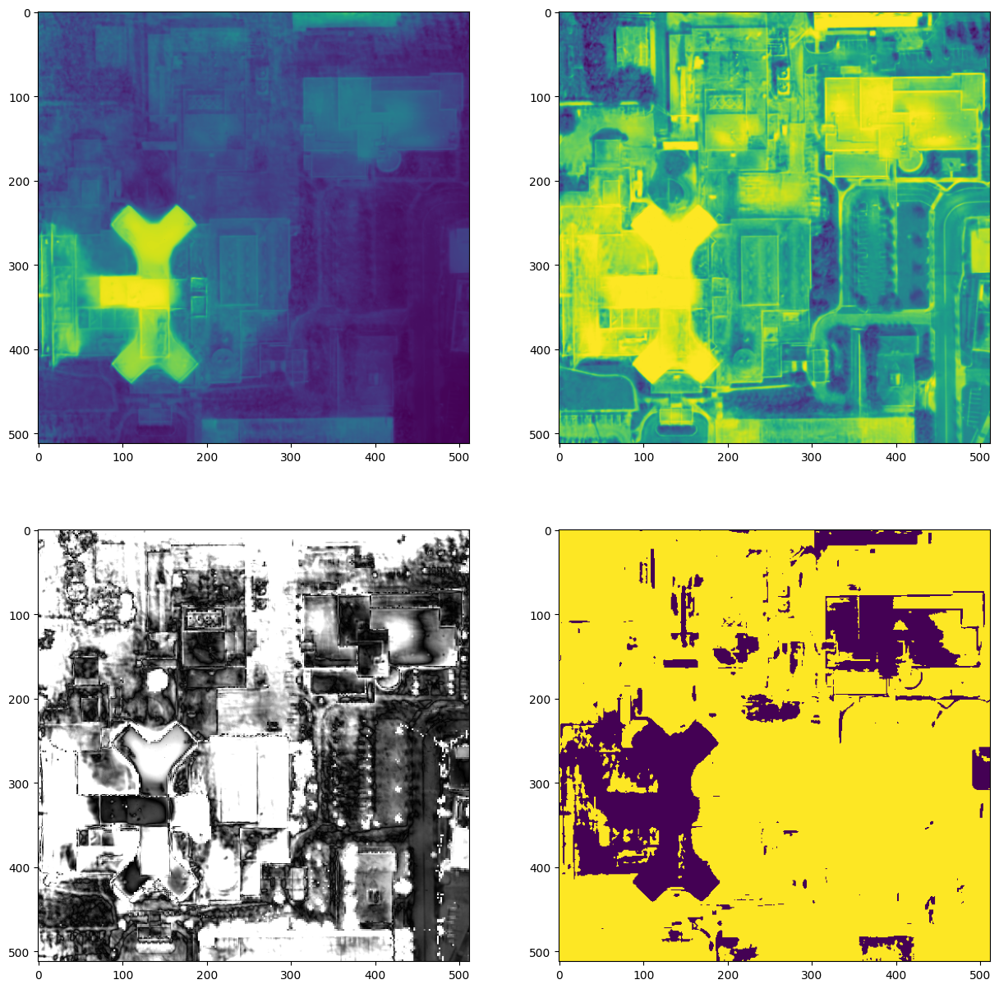

In [ ]:
dsm_intrinsics = torch.tensor([
    [1, 0, 0],
    [0, 1, 0],
    [0, 0, 1]
], dtype=torch.float32, device=device).unsqueeze(0)

dsm_viewmats = torch.tensor([
    [2, 0, 0, 256],
    [0, -2, 0, 256],
    [0, 0, 1, 0],
    [0, 0, 0, 1]], dtype=torch.float32, device=device).unsqueeze(0)

dsm, dsm_alphas, _ = rasterization(
    trainer.means, trainer.quats / trainer.quats.norm(dim=-1, keepdim=True),
    torch.exp(trainer.scales), torch.sigmoid(trainer.opacities),
    trainer.means[:, -1:], dsm_viewmats, dsm_intrinsics,
    512, 512,
    near_plane=-1e+5, far_plane=1e+5,
    camera_model="ortho", packed=False,)

plt.figure(figsize=(15,15))
plt.subplot(2,2,1)
plt.imshow(trainer.dsm.detach().cpu().numpy()[0])
plt.subplot(2,2,2)
plt.imshow(trainer.dsm_alphas.detach().cpu().numpy()[0])
plt.subplot(2,2,3)
plt.imshow(np.clip(np.abs(jax_dataset.dsm - trainer.dsm[0, :, :, -1].numpy()),0, 5), cmap = 'gray')
plt.subplot(2,2,4)
plt.imshow(trainer.dsm_alphas[0] < 0.9)
offset = (jax_dataset.dsm - trainer.dsm[0, :, :, -1].numpy()).mean()
print("MAE:", np.abs(jax_dataset.dsm - trainer.dsm[0, :, :, -1].numpy()).mean())
print("Mean offset:", offset)
print("MAE offset:", np.abs(jax_dataset.dsm - trainer.dsm[0, :, :, -1].numpy() - offset).mean())

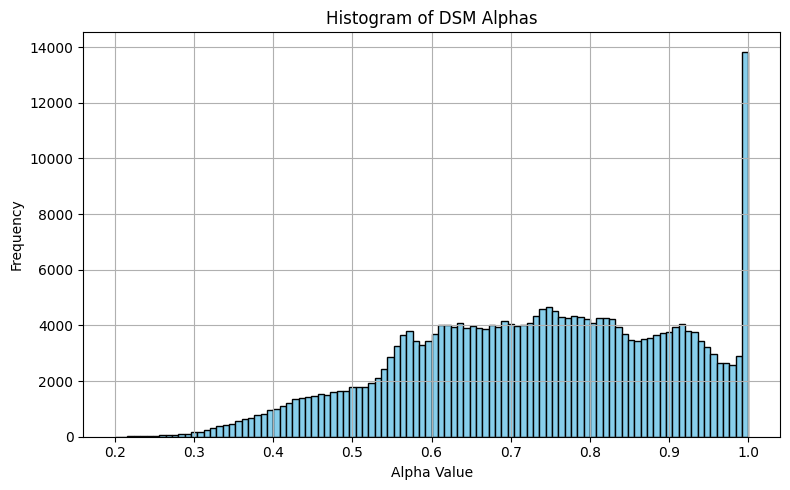

In [ ]:
from matplotlib import pyplot as plt
import numpy as np

# Assuming trainer.dsm_alphas is a torch tensor on CPU with shape [1, H, W, 1] or similar
dsm_alphas_np = trainer.dsm_alphas.numpy().flatten()

# Optional: filter invalid/small values (like near-zero alphas)
# dsm_alphas_np = dsm_alphas_np[dsm_alphas_np > 1e-3]

plt.figure(figsize=(8, 5))
plt.hist(dsm_alphas_np, bins=100, color='skyblue', edgecolor='black')
plt.title('Histogram of DSM Alphas')
plt.xlabel('Alpha Value')
plt.ylabel('Frequency')
plt.grid(True)
plt.tight_layout()
plt.show()

(512, 512)
(1, 512, 512, 1)


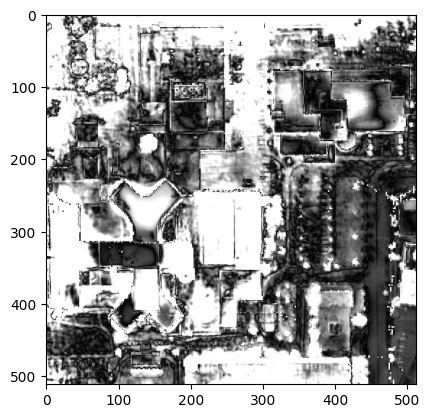

In [ ]:
print(jax_dataset.dsm.shape)
print(trainer.dsm.numpy().shape)
plt.imshow(np.clip(np.abs(jax_dataset.dsm - trainer.dsm.numpy()[0, :, :, -1]), 0, 5), cmap='gray')

[-28.605011 -28.464834 -28.432148 ...  23.830824  23.83342   23.837883]
[-27.344265 -27.30234  -27.294071 ...  23.864456  23.872185  23.874775]
[-27.20655  -27.099976 -27.09226  ...  23.847836  23.860405  23.860634]
[-26.295788 -26.295786 -26.295784 ...  29.218746  29.218748  29.21875 ]


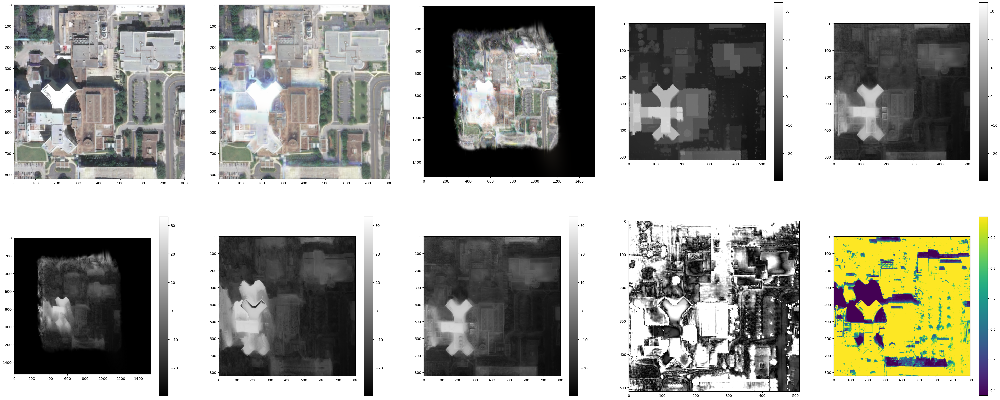

In [ ]:
plt.figure(figsize=(50,20))
plt.subplot(2,5,1)
plt.imshow(trainer.renders.numpy()[0])
plt.subplot(2,5,2)
plt.imshow(trainer.albedo.numpy()[0])
plt.subplot(2,5,3)
plt.imshow(trainer.renders_S.numpy()[0])
plt.subplot(2,5,4)
im = plt.imshow(jax_dataset.dsm, cmap = 'gray', vmin = trainer.min_z , vmax = trainer.max_z )
plt.colorbar(im)
plt.subplot(2,5,5)
im = plt.imshow(trainer.dsm.numpy()[0], cmap = 'gray',  vmin = trainer.min_z , vmax = trainer.max_z )
plt.colorbar(im)
print(np.unique(trainer.coeff_after.numpy()))
print(np.unique(trainer.coeff_before.numpy()))
print(np.unique(trainer.dsm.numpy()[0]))
print(np.unique(jax_dataset.dsm))
plt.subplot(2,5,6)
im = plt.imshow(trainer.renders_height_S[0, :, :, 0].numpy(), cmap = 'gray',  vmin = trainer.min_z , vmax = trainer.max_z )
plt.colorbar(im)
plt.subplot(2,5,7)
im = plt.imshow(trainer.coeff_after.numpy(), cmap = 'gray',  vmin = trainer.min_z , vmax = trainer.max_z )
plt.colorbar(im)
plt.subplot(2,5,8)
im = plt.imshow(trainer.coeff_before.numpy(), cmap = 'gray',  vmin = trainer.min_z , vmax = trainer.max_z )
plt.colorbar(im)
plt.subplot(2,5,9)
plt.imshow(np.clip(np.abs(jax_dataset.dsm - trainer.dsm[0, :, :, -1].numpy()), 0, 5), cmap = 'gray')
plt.subplot(2,5,10)
im = plt.imshow(trainer.coeff.detach().cpu().numpy()[0])
plt.colorbar(im)

[0.00210792 0.00211089 0.00211627 ... 0.99999774 0.99999905 0.9999994 ]


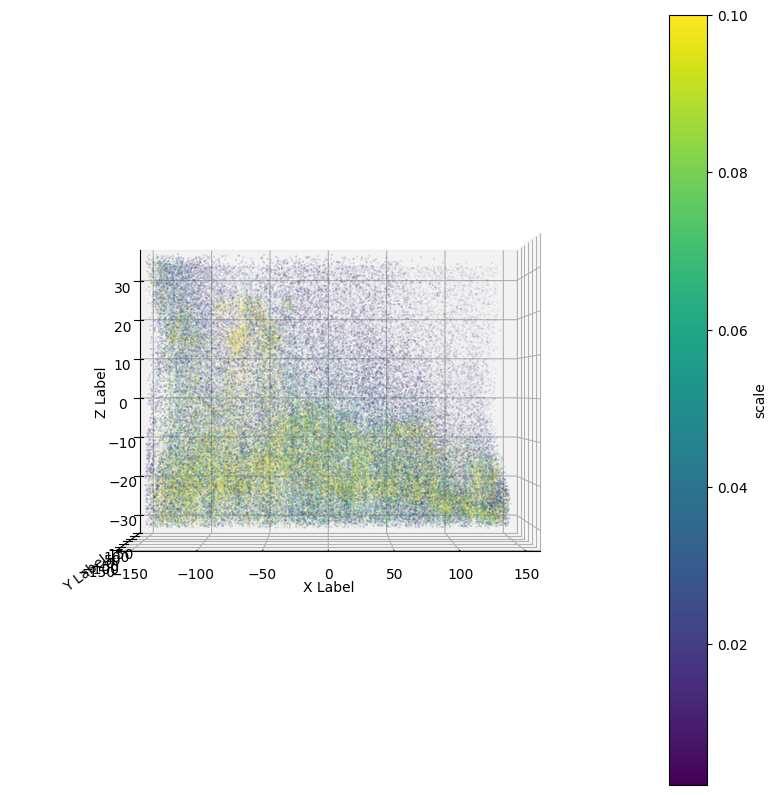

In [ ]:
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import numpy as np

# Sample 3D coordinates
x = trainer.means[:, 0].detach().cpu().numpy()
y = trainer.means[:, 1].detach().cpu().numpy()
z = trainer.means[:, 2].detach().cpu().numpy()

# Scale attribute (assumed shape: (N,))
scale = torch.exp(trainer.scales).detach().cpu().numpy()
scale = scale.mean(axis=1)


scale = torch.sigmoid(trainer.opacities).detach().cpu().numpy()
print(np.unique(scale))

# Normalize scale values for colormap
norm = plt.Normalize(scale.min(), 0.1)
colors = plt.cm.viridis(norm(scale))  # or 'plasma', 'inferno', etc.

# Create 3D scatter plot
fig = plt.figure(figsize=(10, 10))
ax = fig.add_subplot(111, projection='3d')
ax.scatter(x, y, z, c=colors, marker='o', s=0.01)  # Adjust 's' as needed

# Axis labels
ax.set_xlabel('X Label')
ax.set_ylabel('Y Label')
ax.set_zlabel('Z Label')

# Set view angle
ax.view_init(elev=0, azim=-90)

# Optional: Add colorbar
mappable = plt.cm.ScalarMappable(norm=norm, cmap='viridis')
mappable.set_array([])  # Required to avoid warning in newer matplotlib
plt.colorbar(mappable, ax=ax, label='scale')

plt.show()

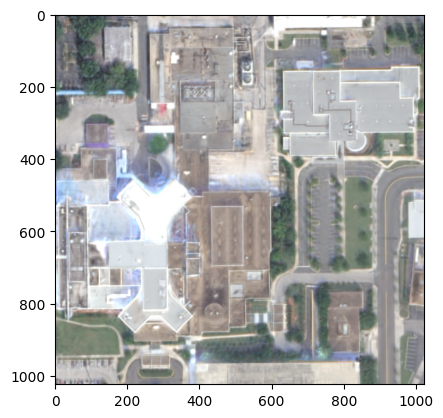

In [ ]:
intrinsics = torch.tensor([
        [1, 0, 0 ],
        [0, 1, 0],
        [0, 0, 1]
], dtype=torch.float32, device=device).unsqueeze(0)

viewmats = torch.tensor([
        [4, 0, 0,  512],
        [0, -4, 0,  512],
        [0, 0, -1, 200],
        [0, 0, 0, 1]], dtype=torch.float32, device=device).unsqueeze(0)

render, _, _ = rasterization(
        trainer.means, trainer.quats / trainer.quats.norm(dim=-1, keepdim=True),
        torch.exp(trainer.scales), torch.sigmoid(trainer.opacities),
        trainer.rgbs, viewmats, intrinsics,
        1024, 1024,
        near_plane=-1e+5, far_plane=1e+5,
        camera_model="ortho", packed=False,)

plt.imshow(render[0].detach().cpu().numpy())

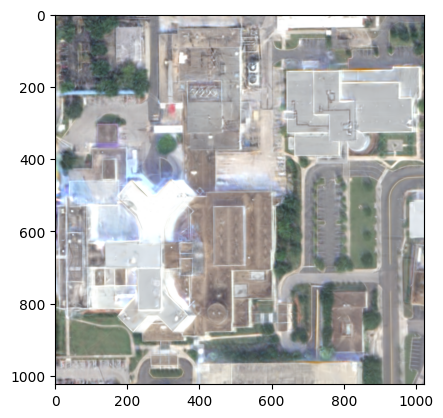

In [ ]:
    azim = 15
    elev = 180  # constant or vary if you like
    viewmats = get_viewmat(elev, azim)

    render, _, _ = rasterization(
        trainer.means,
        trainer.quats / trainer.quats.norm(dim=-1, keepdim=True),
        torch.exp(trainer.scales),
        torch.sigmoid(trainer.opacities),
        trainer.rgbs,
        #(trainer.means[:, -1:] + trainer.a) / trainer.b,
        viewmats, intrinsics,
        width=1024, height=1024,
        near_plane=-1e5, far_plane=1e5,
        camera_model="ortho", packed=False,
    )

    img = (torch.clamp(render[0],0,1).detach().cpu().numpy() * 255).astype('uint8')
    plt.imshow(img)

In [ ]:
frames = []
angles = list(range(0, 361, 15))  # Azimuth from 0 to 180 degrees
elevations = list(range(0, 180, 5))  # Elevation from 90 down to 65 (optional adjust)

def get_viewmat(elev_deg, azim_deg, distance=500):
    elev = math.radians(elev_deg)
    azim = math.radians(azim_deg)

    # Rotation around X (elevation)
    Rx = torch.tensor([
        [1, 0, 0],
        [0, math.cos(elev), -math.sin(elev)],
        [0, math.sin(elev),  math.cos(elev)]
    ])

    # Rotation around Y (azimuth)
    Ry = torch.tensor([
        [math.cos(azim), 0, math.sin(azim)],
        [0, 1, 0],
        [-math.sin(azim), 0, math.cos(azim)]
    ])

    R = Ry @ Rx  # Combined rotation matrix (3x3)

    # Camera positioned along -Z axis in its local frame → transformed into world
    cam_z = torch.tensor([0, 0, distance], dtype=torch.float32)
    T = cam_z  # Move camera back from origin

    viewmat = torch.eye(4, dtype=torch.float32)
    viewmat[:3, :3] = R
    viewmat[:3, 3] = T
    return viewmat.to(device).unsqueeze(0)

intrinsics = torch.tensor([
    [4, 0, 512],
    [0, 4, 512],
    [0, 0, 1]
], dtype=torch.float32, device=device).unsqueeze(0)

# Loop and render

for azim in tqdm(angles):
    elev = 180  # constant or vary if you like
    viewmats = get_viewmat(elev, azim)

    render, _, _ = rasterization(
        trainer.means,
        trainer.quats / trainer.quats.norm(dim=-1, keepdim=True),
        torch.exp(trainer.scales),
        torch.sigmoid(trainer.opacities),
        #trainer.rgbs,
        (trainer.means[:, -1:] + trainer.a) / trainer.b,
        viewmats, intrinsics,
        width=1024, height=1024,
        near_plane=-1e5, far_plane=1e5,
        camera_model="ortho", packed=False,
    )

    img = (torch.clamp(render[0, :, :, 0],0,1).detach().cpu().numpy() * 255).astype('uint8')
    frames.append(img)

for azim in tqdm(angles):
    elev = 165  # constant or vary if you like
    viewmats = get_viewmat(elev, azim)

    render, _, _ = rasterization(
        trainer.means,
        trainer.quats / trainer.quats.norm(dim=-1, keepdim=True),
        torch.exp(trainer.scales),
        torch.sigmoid(trainer.opacities),
        #trainer.rgbs,
        (trainer.means[:, -1:] + trainer.a) / trainer.b,
        viewmats, intrinsics,
        width=1024, height=1024,
        near_plane=-1e5, far_plane=1e5,
        camera_model="ortho", packed=False,
    )

    img = (torch.clamp(render[0, :, :, 0],0,1).detach().cpu().numpy() * 255).astype('uint8')
    frames.append(img)


for azim in tqdm(angles):
    elev = 150  # constant or vary if you like
    viewmats = get_viewmat(elev, azim)

    render, _, _ = rasterization(
        trainer.means,
        trainer.quats / trainer.quats.norm(dim=-1, keepdim=True),
        torch.exp(trainer.scales),
        torch.sigmoid(trainer.opacities),
        #trainer.rgbs,
        (trainer.means[:, -1:] + trainer.a) / trainer.b,
        viewmats, intrinsics,
        width=1024, height=1024,
        near_plane=-1e5, far_plane=1e5,
        camera_model="ortho", packed=False,
    )

    img = (torch.clamp(render[0, :, :, 0],0,1).detach().cpu().numpy() * 255).astype('uint8')
    frames.append(img)
for azim in tqdm(angles):
    elev = 135  # constant or vary if you like
    viewmats = get_viewmat(elev, azim)

    render, _, _ = rasterization(
        trainer.means,
        trainer.quats / trainer.quats.norm(dim=-1, keepdim=True),
        torch.exp(trainer.scales),
        torch.sigmoid(trainer.opacities),
        #trainer.rgbs,
        (trainer.means[:, -1:] + trainer.a) / trainer.b,
        viewmats, intrinsics,
        width=1024, height=1024,
        near_plane=-1e5, far_plane=1e5,
        camera_model="ortho", packed=False,
    )

    img = (torch.clamp(render[0, :, :, 0],0,1).detach().cpu().numpy() * 255).astype('uint8')
    frames.append(img)
for azim in tqdm(angles):
    elev = 120 # constant or vary if you like
    viewmats = get_viewmat(elev, azim)

    render, _, _ = rasterization(
        trainer.means,
        trainer.quats / trainer.quats.norm(dim=-1, keepdim=True),
        torch.exp(trainer.scales),
        torch.sigmoid(trainer.opacities),
        #trainer.rgbs,
        (trainer.means[:, -1:] + trainer.a) / trainer.b,
        viewmats, intrinsics,
        width=1024, height=1024,
        near_plane=-1e5, far_plane=1e5,
        camera_model="ortho", packed=False,
    )

    img = (torch.clamp(render[0, :, :, 0],0,1).detach().cpu().numpy() * 255).astype('uint8')
    frames.append(img)
for azim in tqdm(angles):
    elev = 105  # constant or vary if you like
    viewmats = get_viewmat(elev, azim)

    render, _, _ = rasterization(
        trainer.means,
        trainer.quats / trainer.quats.norm(dim=-1, keepdim=True),
        torch.exp(trainer.scales),
        torch.sigmoid(trainer.opacities),
        #trainer.rgbs,
        (trainer.means[:, -1:] + trainer.a) / trainer.b,
        viewmats, intrinsics,
        width=1024, height=1024,
        near_plane=-1e5, far_plane=1e5,
        camera_model="ortho", packed=False,
    )

    img = (torch.clamp(render[0, :, :, 0],0,1).detach().cpu().numpy() * 255).astype('uint8')
    frames.append(img)
for azim in tqdm(angles):
    elev = 90  # constant or vary if you like
    viewmats = get_viewmat(elev, azim)

    render, _, _ = rasterization(
        trainer.means,
        trainer.quats / trainer.quats.norm(dim=-1, keepdim=True),
        torch.exp(trainer.scales),
        torch.sigmoid(trainer.opacities),
        #trainer.rgbs,
        (trainer.means[:, -1:] + trainer.a) / trainer.b,
        viewmats, intrinsics,
        width=1024, height=1024,
        near_plane=-1e5, far_plane=1e5,
        camera_model="ortho", packed=False,
    )

    img = (torch.clamp(render[0, :, :, 0],0,1).detach().cpu().numpy() * 255).astype('uint8')
    frames.append(img)
# Save GIF
gif_path = "/content/drive/MyDrive/msplat/result_ply/rotation_dsm.gif"
imageio.mimsave(gif_path, frames, duration=0.30)
print(f"✅ Saved GIF to: {gif_path}")

100%|██████████| 25/25 [00:00<00:00, 260.69it/s]


✅ Saved GIF to: /content/drive/MyDrive/msplat/result_ply/rotation_dsm.gif


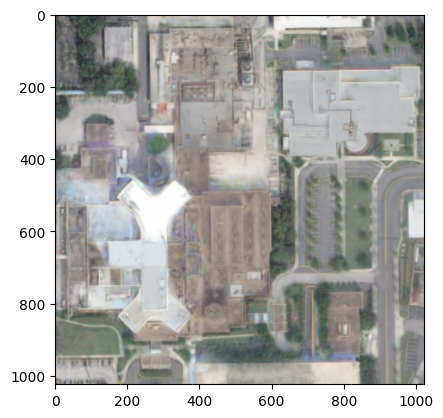

In [ ]:

    elev = 180  # constant or vary if you like
    viewmats = get_viewmat(elev, azim)

    render, _, _ = rasterization(
        trainer.means,
        trainer.quats / trainer.quats.norm(dim=-1, keepdim=True),
        torch.exp(trainer.scales),
        torch.sigmoid(trainer.opacities),
        torch.clamp(trainer.rgbs, 0, 1),
        #(trainer.means[:, -1:] + trainer.a) / trainer.b,
        viewmats, intrinsics,
        width=1024, height=1024,
        near_plane=-1e5, far_plane=1e5,
        camera_model="ortho", packed=False,
    )

    img = (torch.clamp(render[0],0,1).detach().cpu().numpy() * 255).astype('uint8')
    plt.imshow(img)

In [ ]:
d

In [ ]:
s

# BaseLine Runner

In [ ]:
from tifffile import imwrite
class SimpleTrainer:
    """Trains random gaussians to fit an image."""

    def __init__(
        self,
        num_points: int = 500000,
    ):
        self.device = torch.device("cuda:0")
        self.num_points = num_points
        self._init_gaussians()
        self.iter = 0
    def _init_gaussians(self):
        """Random gaussians"""
        bd = 256

        self.means = bd * (torch.rand(self.num_points, 3, device=self.device) - 0.5)
        self.means[:, -1] = 100 * (torch.rand(self.num_points, device=self.device) - 0.5)
        self.scales = torch.ones(self.num_points, 3, device=self.device) * 0.3
        d = 3
        self.rgbs = torch.rand(self.num_points, 3, device=self.device)

        u = torch.ones(self.num_points, 1, device=self.device)
        v = torch.zeros(self.num_points, 1, device=self.device)
        w = torch.zeros(self.num_points, 1, device=self.device)

        self.quats = torch.cat(
            [
                torch.sqrt(1.0 - u) * torch.sin(2.0 * math.pi * v),
                torch.sqrt(1.0 - u) * torch.cos(2.0 * math.pi * v),
                torch.sqrt(u) * torch.sin(2.0 * math.pi * w),
                torch.sqrt(u) * torch.cos(2.0 * math.pi * w),
            ],
            -1,
        )
        self.opacities = torch.ones((self.num_points), device=self.device) * -4.5

        self.means.requires_grad = True
        self.scales.requires_grad = True
        self.quats.requires_grad = True
        self.rgbs.requires_grad = True
        self.opacities.requires_grad = True

        self.frames = []
        self.frames2 = []

    def train(
        self,
        iterations: int = 5000,
        lr: float = 0.01,
        save_imgs: bool = False,
        model_type: Literal["3dgs", "2dgs"] = "3dgs",
    ):
        self.optimizer = optim.Adam(
            [self.rgbs, self.means, self.scales, self.opacities, self.quats], lr
        )
        mse_loss = torch.nn.MSELoss()

        times = [0] * 2  # rasterization, backward

        if model_type == "3dgs":
            rasterize_fnc = rasterization
        elif model_type == "2dgs":
            rasterize_fnc = rasterization_2dgs

        dsm_intrinsics = torch.tensor([
            [2, 0, 256],
            [0, -2, 256],
            [0, 0, 1]
        ], dtype=torch.float32, device=device).unsqueeze(0)
        dsm_viewmats = torch.eye(4, dtype=torch.float32, device=device).unsqueeze(0)

        # elevation function
        e = torch.tensor([0.0, 0.0, 1.0, 0.0]).to(device)

        for iter in range(self.iter, iterations):
            loss = 0
            start = time.time()
            for idx, batch in enumerate(jax_loader):
                # ---------------------------------------------------------------------------------
                # gets data from data_loader
                img, R, intrinsics, V, Loc, V_S, ic, jc, height, width = batch
                img = img                 # [B, 3]
                intrinsics = intrinsics   # [B, 3, 3]
                V = V                     # [B, 4, 4]
                Loc = Loc
                # ---------------------------------------------------------------------------------

                # random gaussian parameters for perturbation
                q1, q2 = torch.torch.rand(2, dtype=torch.float32) * 2 - 1

                # randomly perturbe camera B [B, 4, 4]
                B = V + (0.05 * torch.outer(torch.tensor([q1, q2, 0.0, 0.0]).to(device), e)).unsqueeze(0)

                # rgb + altitude in last dimension
                rgba = torch.cat([torch.sigmoid(self.rgbs), self.means[ :, -1:]], dim=-1) # [N, 4]

                # ---------------------------------------------------------------------------------
                # renders: [C, N, 4]
                renders = rasterize_fnc(
                    self.means, self.quats / self.quats.norm(dim=-1, keepdim=True),
                    self.scales, torch.sigmoid(self.opacities),
                    torch.sigmoid(self.rgbs),
                    V, intrinsics,
                    width, height,
                    near_plane=-1e+5, far_plane=1e+5,
                    camera_model="ortho", packed=False,)[0]

                renders_feature = renders[:, :, :3]    # [B, N, 3]
                renders_height = renders[:, :, -1]     # [B, N]
                '''
                renders_B = rasterize_fnc(
                    self.means, self.quats / self.quats.norm(dim=-1, keepdim=True),
                    self.scales, torch.sigmoid(self.opacities),
                    rgba,
                    B, intrinsics,
                    width, height,
                    near_plane=1e-5, far_plane=1e+5,
                    camera_model="ortho", packed=False,)[0]

                renders_feature_B = renders_B[:, :, :3] # [B, N, 3]
                renders_height_B = renders_B[:, :, -1]  # [B, N]
                '''
                renders_S = rasterize_fnc(
                    self.means, self.quats / self.quats.norm(dim=-1, keepdim=True),
                    self.scales, torch.sigmoid(self.opacities),
                    torch.sigmoid(self.rgbs),
                    V_S, intrinsics,
                    width, height,
                    near_plane=-1e+5, far_plane=1e+5,
                    camera_model="ortho", packed=False,)[0]

                renders_feature_S = renders_S[:, :, :3] # [B, N, 3]
                renders_height_S = renders_S[:, :, -1]  # [B, N]
                # ---------------------------------------------------------------------------------

                self.renders = renders.detach().cpu()
                self.renders_S = renders_S.detach().cpu()

                torch.cuda.synchronize()
                times[0] += time.time() - start
                l1loss = F.l1_loss(renders[:,:,:,:3], img)
                ssimloss = 1.0 - fused_ssim(
                    renders.permute(0, 3, 1, 2), img.permute(0, 3, 1, 2), padding="valid"
                )
                loss_tmp = l1loss * 0.8 + ssimloss * 0.2
                loss += loss_tmp



            with torch.no_grad():
                dsm, dsm_alphas, _ = rasterize_fnc(
                    self.means, self.quats / self.quats.norm(dim=-1, keepdim=True),
                    self.scales, torch.sigmoid(self.opacities),
                    self.means[:, -1:], dsm_viewmats, dsm_intrinsics,
                    512, 512,
                    near_plane=1e-5, far_plane=1e+5,
                    camera_model="ortho", packed=False,)

                self.dsm = dsm.detach().cpu()
                self.dsm_alphas = dsm_alphas.detach().cpu()

            if iter % 50 == 0:
                print(f"Iteration {iter + 1}/{iterations}, Loss: {loss.item():.4f}, MAE: {np.abs(jax_dataset.dsm - self.dsm[0, :, :, -1].numpy()).mean(): .3f}")

            if save_imgs and iter % 50 == 0:
                self.frames.append(((self.dsm[0, :, :, -1] * 4.5).numpy()).astype(np.uint8))
                self.frames2.append((self.renders[0,:,:,:3].numpy() * 255).astype(np.uint8))

            self.optimizer.zero_grad()
            start = time.time()

            loss.backward()
            torch.cuda.synchronize()
            times[1] += time.time() - start
            self.optimizer.step()
            self.iter = iter + 1

        print(f"Total(s):\nRasterization: {times[0]:.3f}, Backward: {times[1]:.3f}")
        print(f"Per step(s):\nRasterization: {times[0]/iterations:.5f}, Backward: {times[1]/iterations:.5f}")


    def save_imgs(self):
        # save them as a gif with PIL
        self.frames = [Image.fromarray(frame) for frame in self.frames]
        self.frames2 = [Image.fromarray(frame2) for frame2 in self.frames2]
        out_dir = os.path.join(os.getcwd(), "results")
        imwrite(f'{out_dir}/dsm.tif', self.dsm[0, :, :, -1].numpy())
        imwrite(f'{out_dir}/dsm_alpha.tif', (self.dsm / self.dsm_alphas)[0, :, :, -1].numpy())
        os.makedirs(out_dir, exist_ok=True)
        self.frames[0].save(
            f"{out_dir}/dsm.gif",
            save_all=True,
            append_images=self.frames[1:],
            optimize=False,
            duration=5,
            loop=0,
        )
        self.frames2[0].save(
            f"{out_dir}/img.gif",
            save_all=True,
            append_images=self.frames2[1:],
            optimize=False,
            duration=5,
            loop=0,
        )

def image_path_to_tensor(image_path: Path):
    import torchvision.transforms as transforms

    img = Image.open(image_path)
    transform = transforms.ToTensor()
    img_tensor = transform(img).permute(1, 2, 0)[..., :3]
    return img_tensor

trainer = SimpleTrainer(num_points=1000000)


In [ ]:
trainer.train(
    iterations=5000,
    lr=0.01,
    save_imgs=True,
    model_type="3dgs",
)

In [ ]:
print(trainer.iter)
dsm = trainer.dsm[0, :, :, -1].numpy()
print(dsm.shape)
plt.imshow(dsm)
print(np.unique(dsm))
print(np.unique(jax_dataset.dsm))
print(np.abs(jax_dataset.dsm - dsm).mean())

In [ ]:
print(jax_dataset.dsm.shape)

In [ ]:
trainer.save_imgs()

In [ ]:
s

In [ ]:
def posW2C(R, t, pW):
    """Transforms a 3D position from world to camera coordinates."""
    return R @ pW + t

def covarW2C(R, covarW):
    """Transforms a covariance matrix from world to camera coordinates."""
    return R @ covarW @ R.T

def ortho_proj(mean3d, cov3d, fx, fy, cx, cy, width, height):
    """Projects 3D mean/covariance to 2D using orthographic projection."""
    x, y, z = mean3d

    # Jacobian J: 2x3 matrix
    J = np.array([
        [fx, 0.0, 0.0],
        [0.0, fy, 0.0]
    ])  # Shape (2, 3)

    cov2d = J @ cov3d @ J.T  # Shape (2, 2)
    mean2d = np.array([fx * x + cx, fy * y + cy])  # Shape (2,)

    return cov2d, mean2d

In [ ]:
def decompose(R, ic, jc):
    # Ensure R is a 3x4 matrix
    assert R.shape == (3, 4), "Input matrix must be 3x4"

    # Split into rotation (3x3) and translation (3x1) parts
    M = R[:, :3]
    t = R[:, 3]

    # RQ decomposition to get intrinsic matrix K and rotation matrix R_
    K, _ = rq(M)

    print("++++++++++++++++++++", K, _)

    K[0,2] += ic ; K[1,2] += jc
    K[2,2] = 1

    V = np.eye(4)
    V[:3, :3] = np.linalg.inv(K) @ R[:3, :3]
    V[:3, 3] = np.linalg.inv(K) @ R[:3, 3]
    # Make sure the diagonal of K is positive


    # Camera center in world coordinates

    #print(V, '\n', K)

    return V, K

In [ ]:
import numpy as np

img, R, intrinsics, V, Loc, S, V_S, ic, jc, height, width = jax_dataset.__getitem__(9)
R = R.detach().cpu().numpy()

#R[0, 3] += ic
#R[1, 3] += jc
#R[2, :] = [0,0,0,1]
print(R)

V, intrinsics = decompose(R, ic, jc)
print(V, intrinsics)

print('generated projection matrix:\n', R[:3,])

'''
i_coord = R[0, :3] / np.linalg.norm(R[0, :3])

# Grahm-Schdmit
j_coord = R[1, :3]
j_coord = j_coord - np.dot(j_coord, i_coord) * i_coord
j_coord = j_coord / np.linalg.norm(j_coord)

# right handed law -> downward is positive -> negative value means upwarded
h_coord = np.cross(i_coord, j_coord)
h_coord /= np.linalg.norm(h_coord)
print("h_coord\n", h_coord / np.linalg.norm(h_coord))

V = np.eye(4)
V[0, :3] = i_coord ; V[1, :3] = j_coord ; V[2, :3] = h_coord

#V[2,2] = 1
#Rot = V[:3, :3]

#print("Extrinsic Rotation Parameters:\n", Rot)
#print("R.T @ R:\n", np.transpose(Rot) @ Rot)
# defined projection matrix
# (0,0,0) in world coordinate to (ic, jc) in image coordinate
# therefore, t vector: [0,0,0]
#Rot[2, :] = [1e-8, 1e-8, 1e-8]

#print("Image center:", ic, jc)

intrinsics = R[:3,:3] @ np.linalg.inv(V[:3,:3])
intrinsics[0,2] += ic
intrinsics[1,2] += jc
intrinsics[2,2] = 1

print("Intrinsicts:\n", intrinsics)
print(intrinsics @ V[:3, :3])

K_inv = np.linalg.inv(intrinsics)
Rt = K_inv @ R[:3, :]  # This gives [R | t]
print(Rt)

t_est = Rt[:, 3].reshape(3, 1)
extrinsic = np.hstack((V[:3, :3], t_est))

V[:3, :4] = extrinsic

print("viewpoint matrix:\n", V)
#print("calculated projection matrix:\n", intrinsics @ extrinsic )

# one question...
# pinhole -> fov -> set arbitrally 90 120 150 (compute from images) -> ortho proj
'''
V, intrinsics = decompose(R, ic, jc)

X_world = [128, 128, 30, 1]
print('result:', R @ X_world)
pW = X_world[:3]  # [0, 0, 0]
R_cam = V[:3, :3]
t_cam = V[:3, 3]

# Project point to camera coordinates
pC = posW2C(R_cam, t_cam, pW)
print("Position in Camera Coordinates:", pC)

# Assume isotropic 3D uncertainty
covarW = np.eye(3) * 0.01
covarC = covarW2C(R_cam, covarW)

# Use fx, fy from K
fx, fy = intrinsics[0, 0], intrinsics[1, 1]
cx, cy = intrinsics[0, 2], intrinsics[1, 2]

cov2d, mean2d = ortho_proj(pC, covarC, fx, fy, cx, cy, width, height)
print("Projected 2D Point:", mean2d)
print("2D Covariance Matrix:\n", cov2d)

R_altered = np.array([[fx, 0, cx],
                      [0, fy, cy],
                      [0, 0, 1]])

print(R_altered)

X_Cam = R_altered @ V[:3, :3]

print(X_Cam)
print(X_Cam @ X_world)



[[ 3.2241006e+00 -1.8296186e-02 -1.9733880e-01  4.1520251e+02]
 [-3.2402687e-02 -3.2187910e+00 -2.4250527e-01  4.1422495e+02]
 [-2.3803359e-08  2.8812241e-09 -6.7202888e-07  1.0000000e+00]]
++++++++++++++++++++ [[ 3.2291150e+00 -5.2144751e-03  8.3009444e-02]
 [ 0.0000000e+00  3.2198927e+00  2.2970675e-01]
 [ 0.0000000e+00  0.0000000e+00  6.7245645e-07]] [[ 0.9993449  -0.00739092 -0.03542863]
 [-0.00753802 -0.99996334 -0.0040202 ]
 [-0.03539762  0.00428463 -0.99936414]]
[[ 9.98433828e-01 -7.28064915e-03 -6.11490607e-02  2.44432831e+00]
 [-1.00601669e-02 -9.99658167e-01 -7.52267689e-02 -2.19595337e+00]
 [-2.38033593e-08  2.88122415e-09 -6.72028875e-07  1.00000000e+00]
 [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  1.00000000e+00]] [[ 3.2291150e+00 -5.2144751e-03  4.0729807e+02]
 [ 0.0000000e+00  3.2198927e+00  4.2129565e+02]
 [ 0.0000000e+00  0.0000000e+00  1.0000000e+00]]
generated projection matrix:
 [[ 3.2241006e+00 -1.8296186e-02 -1.9733880e-01  4.1520251e+02]
 [-3.2402687e-02 -3

ValueError: matmul: Input operand 1 has a mismatch in its core dimension 0, with gufunc signature (n?,k),(k,m?)->(n?,m?) (size 4 is different from 3)

In [ ]:
img, R, intrinsics, V, Loc, S, V_S, ic, jc, height, width = jax_dataset.__getitem__(9)

S = S.detach().cpu().numpy()
R = R.detach().cpu().numpy()
V_S = V_S.detach().cpu().numpy()
V = V.detach().cpu().numpy()
intrinsics = intrinsics.detach().cpu().numpy()
X_world = [0, 0, 50, 1]

print(S)
#S[0, 3] += ic
#S[1, 3] += jc
#S[2, :] = [0,0,0,1]

#S_Rot = K_inv @ S[:3, :3]
#S_t = K_inv @ S[:3, 3]
#V_S = np.eye(4)
#V_S[:3, :3] = S_Rot
#V_S[:3, 3] = S_t

print(V_S)

print(S @ X_world)

pW = X_world[:3]  # [0, 0, 0]
R_cam = V_S[:3, :3]
t_cam = V_S[:3, 3]

# Project point to camera coordinates
pC = posW2C(R_cam, t_cam, pW)
print("Position in Camera Coordinates:", pC)

# Assume isotropic 3D uncertainty
covarW = np.eye(3) * 0.01
covarC = covarW2C(R_cam, covarW)

# Use fx, fy from K
fx, fy = intrinsics[0, 0], intrinsics[1, 1]
cx, cy = intrinsics[0, 2], intrinsics[1, 2]

cov2d, mean2d = ortho_proj(pC, covarC, fx, fy, cx, cy, width, height)
print("Projected 2D Point:", mean2d)
print("2D Covariance Matrix:\n", cov2d)


[[ 3.2241006e+00 -1.8296186e-02 -1.9850540e+00  4.1520251e+02]
 [-3.2402687e-02 -3.2187910e+00 -3.8105400e+00  4.1422495e+02]
 [-2.3803359e-08  2.8812241e-09  1.7923380e-08  1.0000000e+00]]
[[ 9.9843389e-01 -7.2806487e-03 -6.1664951e-01  2.4443171e+00]
 [-1.0060167e-02 -9.9965817e-01 -1.1834393e+00 -2.1959519e+00]
 [ 0.0000000e+00  0.0000000e+00 -1.0000000e+00  2.0000000e+02]
 [ 0.0000000e+00  0.0000000e+00  0.0000000e+00  1.0000000e+00]]
[315.94981384 223.69794703   1.0000009 ]
Position in Camera Coordinates: [-28.38815832 -61.36791468 150.        ]
Projected 2D Point: [315.62943706 223.69755135]
2D Covariance Matrix:
 [[0.14360107 0.07558923]
 [0.07558923 0.24881944]]


In [ ]:
import numpy as np
from scipy.linalg import rq

X_world = np.array([0, 0, 10, 1])
img, gt, R, Loc, S, ic, jc, height, width = jax_dataset.__getitem__(0)
R = R.detach().cpu().numpy()
R[2, :] = [0,0,0,1]
print(R @ X_world)

R[0,3] -= ic
R[1,3] -= jc
#R[2, :] = [0,0,-1,0]
print(R)

P = R[:, :3]  # the first 3x3 part of the projection matrix (without translation)

# Perform RQ decomposition on P to get K and R
K, R_rot = rq(P)
#K[0,2] = ic
#K[1,2] = jc
K[2,2] = 1

# Ensure K has positive diagonal (to ensure correct orientation)
T = np.diag(np.sign(np.diag(K)))
K = K @ T
#R_rot = T @ R_rot
#R_rot[2,2] = 0

print('K:\n', K, '\nR_Rot:\n', R_rot)

# Translation vector
t = np.linalg.inv(K[:3,:3]) @ R[:3, 3]

print("Intrinsic matrix (K):\n", K)
print("Rotation matrix (R):\n", R_rot)
print("Translation vector (t):\n", t)

# You can reconstruct the full [R | t] if needed
Rt = np.hstack((R_rot[:3,:3], t.reshape(-1, 1)))

T_view = np.zeros((4,4))
T_view[:3, :3] = R_rot[:3, :3]
T_view[2,2] = 0
T_view[:3, 3] = t
#T_view[2,3] = 1#
T_view[3,3] = 1


print("World-to-Camera 4x4 Homogeneous Matrix:\n", T_view)


X_camera = T_view[:3,:] @ X_world
print("World-to-Camera Transformation:\n", X_camera)
X_world_recovered = K @ X_camera
print("X_world_recovered_tmp:", X_world_recovered)
X_world_recovered /= X_world_recovered[2]


print("Recovered World Point from Camera-to-World", X_world_recovered)
print("calculated world coordinate", R @ X_world)


In [ ]:
R = viewmats[:3, :3]


In [ ]:
import numpy as np
from scipy.linalg import rq

X_world = np.array([0, 0, 0, 1])
img, gt, R, Loc, S, ic, jc, height, width = jax_dataset.__getitem__(0)
R = S.detach().cpu().numpy()
#R[2, :] = [0,0,0,1]
print(ic, jc)

R[0,3] -= ic
R[1,3] -= jc
#R[2, :] = [0,0,-1,0]
print(R)

P = R[:, :3]  # the first 3x3 part of the projection matrix (without translation)

# Perform RQ decomposition on P to get K and R
K, R_rot = rq(P)
#K[0,2] = ic
#K[1,2] = jc
K[2,2] = 1

# Ensure K has positive diagonal (to ensure correct orientation)
#T = np.diag(np.sign(np.diag(K)))
#K = K @ T
#R_rot = T @ R_rot
#R_rot[2,2] = 0

print('K:\n', K, '\nR_Rot:\n', R_rot)

# Translation vector
t = np.linalg.inv(K[:3,:3]) @ R[:3, 3]

print("Intrinsic matrix (K):\n", K)
print("Rotation matrix (R):\n", R_rot)
print("Translation vector (t):\n", t)

# You can reconstruct the full [R | t] if needed
Rt = np.hstack((R_rot[:3,:3], t.reshape(-1, 1)))

T_view = np.zeros((4,4))
T_view[:3, :3] = R_rot[:3, :3]
#T_view[2,2] = 0
T_view[:3, 3] = t
#T_view[2,3] = 1#
T_view[3,3] = 1


print("World-to-Camera 4x4 Homogeneous Matrix:\n", T_view)


X_camera = T_view[:3,:] @ X_world
X_world_recovered = K @ X_camera
print("X_world_recovered_tmp:", X_world_recovered)
X_world_recovered /= X_world_recovered[2]

print("World-to-Camera Transformation:\n", X_camera)
print("Recovered World Point from Camera-to-World", X_world_recovered)
print("calculated world coordinate", R @ X_world)
